In [3]:
import numpy as np
import pandas as pd

# 2.1. Problem Statement: Numpy

# Problem Statement 1:
Write a function so that the columns of the output matrix are powers ofthe input vector.

The order of the powers is determined by the increasing boolean argument. Specifically, when
increasing is False, the i-th output column is the input vector raised element-wise to the power
of N - i - 1.

HINT: Such a matrix with a geometric progression in each row is named for Alexandre-
Theophile Vandermonde.

In [59]:
def powers(x,N):
    return np.vander(x,N)
    

powers([1,2,3,5],4)

array([[  1,   1,   1,   1],
       [  8,   4,   2,   1],
       [ 27,   9,   3,   1],
       [125,  25,   5,   1]])

In [60]:
def trpowers(x,N):
    return np.vander(x,N, increasing = True)

trpowers([1,2,3,5],4)

array([[  1,   1,   1,   1],
       [  1,   2,   4,   8],
       [  1,   3,   9,  27],
       [  1,   5,  25, 125]])

# Problem Statement 2:
Given a sequence of n values x1, x2, ..., xn and a window size k>0, the k-th moving average
of the given sequence is defined as follows:
The moving average sequence has n-k+1 elements as shown below.
The moving averages with k=4 of a ten-value sequence (n=10) is shown below

i 1 2 3 4 5 6 7 8 9 10

===== == == == == == == == == == ==

Input 10 20 30 40 50 60 70 80 90 100

y1 25 = (10+20+30+40)/4

y2 35 = (20+30+40+50)/4

y3 45 = (30+40+50+60)/4

y4 55 = (40+50+60+70)/4

y5 65 = (50+60+70+80)/4

y6 75 = (60+70+80+90)/4

y7 85 = (70+80+90+100)/4

Thus, the moving average sequence has n-k+1=10-4+1=7 values.

Question: Write a function to find moving average in an array over a window:
Test it over [3, 5, 7, 2, 8, 10, 11, 65, 72, 81, 99, 100, 150] and window of 3.

In [4]:
def Maverage(l,k):
    movavg=[] 
   
    for i, x in enumerate(l, 1):
        if i == (len(l)-k+2):
            break
        else:
            movavg.append(np.ma.average(l[i-1:k+i-1]))   
    return print('The k-th moving average of the given sequence: {}'.format(movavg))

In [5]:
Maverage([3, 5, 7, 2, 8, 10, 11, 65, 72, 81, 99, 100, 150],3)

The k-th moving average of the given sequence: [5.0, 4.666666666666667, 5.666666666666667, 6.666666666666667, 9.666666666666666, 28.666666666666668, 49.333333333333336, 72.66666666666667, 84.0, 93.33333333333333, 116.33333333333333]


# 2.2. Problem Statement: Pandas

# Problem Statement 1:

# 1) How-to-count-distance-to-the-previous-zero
For each value, count the difference of the distance from the previous zero (or the start
of the Series, whichever is closer) and if there are no previous zeros, print the position

Consider a DataFrame df where there is an integer column {'X'[7, 2, 0, 3, 4, 2, 5, 0, 3, 4]}

The values should therefore be [1, 2, 0, 1, 2, 3, 4, 0, 1, 2]. Make this a new column 'Y'.

import pandas as pd

df = pd.DataFrame({'X': [7, 2, 0, 3, 4, 2, 5, 0, 3, 4]})

In [6]:
df = pd.DataFrame({'X': [7, 2, 0, 3, 4, 2, 5, 0, 3, 4]})
x = (df['X'] != 0).cumsum()
y = x != x.shift()
df['Y'] = pd.to_numeric(y.groupby((y != y.shift()).cumsum()).cumsum(),downcast='signed')
df

,X,Y
0,7,1
1,2,2
2,0,0
3,3,1
4,4,2
5,2,3
6,5,4
7,0,0
8,3,1
9,4,2


# 2 Create a DatetimeIndex that contains each business day of 2015 and use it to index a Series of random numbers

In [7]:
dt = pd.date_range(start='01/01/2015',end='12/31/2015')
srn = pd.Series(np.random.rand(len(dt)),index=dt)
srn

2015-01-01    0.940517
2015-01-02    0.856070
2015-01-03    0.026774
2015-01-04    0.592297
2015-01-05    0.176532
2015-01-06    0.902171
2015-01-07    0.160837
2015-01-08    0.771027
2015-01-09    0.204433
2015-01-10    0.752630
2015-01-11    0.585457
2015-01-12    0.809274
2015-01-13    0.451054
2015-01-14    0.438977
2015-01-15    0.614663
2015-01-16    0.249327
2015-01-17    0.031378
2015-01-18    0.383521
2015-01-19    0.589028
2015-01-20    0.162277
2015-01-21    0.152312
2015-01-22    0.828380
2015-01-23    0.659798
2015-01-24    0.260050
2015-01-25    0.055511
2015-01-26    0.707293
2015-01-27    0.561328
2015-01-28    0.320868
2015-01-29    0.620159
2015-01-30    0.252659
                ...   
2015-12-02    0.652973
2015-12-03    0.261339
2015-12-04    0.782150
2015-12-05    0.755171
2015-12-06    0.599047
2015-12-07    0.389164
2015-12-08    0.576397
2015-12-09    0.254143
2015-12-10    0.143280
2015-12-11    0.919237
2015-12-12    0.258992
2015-12-13    0.184127
2015-12-14 

# 3 Find the sum of the values in s for every Wednesday

In [8]:
srn[dt.dayofweek==2].sum()

19.689544363639364

# 4 Average For each calendar month

In [9]:
srn.groupby(pd.Grouper(freq='M')).mean()

2015-01-31    0.461364
2015-02-28    0.528712
2015-03-31    0.563921
2015-04-30    0.513751
2015-05-31    0.461080
2015-06-30    0.515706
2015-07-31    0.522907
2015-08-31    0.379949
2015-09-30    0.443475
2015-10-31    0.596538
2015-11-30    0.455307
2015-12-31    0.490713
Freq: M, dtype: float64

# 5 For each group of four consecutive calendar months in s, find the date on which the highest value occurred.

In [10]:
srn.groupby(pd.TimeGrouper('4M')).idxmax()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: pd.TimeGrouper is deprecated and will be removed; Please use pd.Grouper(freq=...)
  """Entry point for launching an IPython kernel.


2015-01-31   2015-01-01
2015-05-31   2015-05-16
2015-09-30   2015-07-04
2016-01-31   2015-11-23
dtype: datetime64[ns]

# Problem Statement 2:

Read the dataset from the below link
https://raw.githubusercontent.com/guipsamora/pandas_exercises/master/06_Stats/US_Baby_Names/US_Baby_Names_right.csv


In [11]:
path = r"https://raw.githubusercontent.com/guipsamora/pandas_exercises/master/06_Stats/US_Baby_Names/US_Baby_Names_right.csv"

In [12]:
df = pd.read_csv(path)

# Questions

# 1) Delete unnamed columns

In [13]:
df.head()

,Unnamed: 0,Id,Name,Year,Gender,State,Count
0,11349,11350,Emma,2004,F,AK,62
1,11350,11351,Madison,2004,F,AK,48
2,11351,11352,Hannah,2004,F,AK,46
3,11352,11353,Grace,2004,F,AK,44
4,11353,11354,Emily,2004,F,AK,41


In [14]:
df.drop('Unnamed: 0', axis=1,inplace=True)

In [15]:
df.head()

,Id,Name,Year,Gender,State,Count
0,11350,Emma,2004,F,AK,62
1,11351,Madison,2004,F,AK,48
2,11352,Hannah,2004,F,AK,46
3,11353,Grace,2004,F,AK,44
4,11354,Emily,2004,F,AK,41


# 2) Show the distribution of male and female

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [17]:
df['Gender'].value_counts()

F    558846
M    457549
Name: Gender, dtype: int64

# 3) Show the top 5 most preferred names

In [18]:
df['Name'].value_counts().head()

Riley     1112
Avery     1080
Jordan    1073
Peyton    1064
Hayden    1049
Name: Name, dtype: int64

# 4) What is the median name occurrence in the dataset

In [19]:
med = df['Id'].median()
df.loc[df['Id'] == med]['Name']

508197    Kasey
Name: Name, dtype: object

# 5) Distribution of male and female born count by states

In [20]:
df.groupby(['Gender','State']).count()

Id   Name   Year  Count
Gender State                            
F      AK      2404   2404   2404   2404
       AL      9878   9878   9878   9878
       AR      7171   7171   7171   7171
       AZ     14518  14518  14518  14518
       CA     45144  45144  45144  45144
       CO     11424  11424  11424  11424
       CT      6575   6575   6575   6575
       DC      3053   3053   3053   3053
       DE      2549   2549   2549   2549
       FL     25781  25781  25781  25781
       GA     19385  19385  19385  19385
       HI      3255   3255   3255   3255
       IA      7131   7131   7131   7131
       ID      4918   4918   4918   4918
       IL     21268  21268  21268  21268
       IN     13056  13056  13056  13056
       KS      7753   7753   7753   7753
       KY      8817   8817   8817   8817
       LA     10510  10510  10510  10510
       MA     10580  10580  10580  10580
       MD     11276  11276  11276  11276
       ME      2976   2976   2976   2976
       MI     16038  16038  16038  16038
       MN     10677  10677  10677  10677
       MO     11948  11948  11948  11948
       MS      7235   7235   7235   7235
       MT      2690   2690   2690   2690
       NC     17357  17357  17357  17357
       ND      2399   2399   2399   2399
       NE      5370   5370   5370   5370
...             ...    ...    ...    ...
M      ME      2777   2777   2777   2777
       MI     13243  13243  13243  13243
       MN      9004   9004   9004   9004
       MO      9917   9917   9917   9917
       MS      6862   6862   6862   6862
       MT      2986   2986   2986   2986
       NC     13530  13530  13530  13530
       ND      2581   2581   2581   2581
       NE      5029   5029   5029   5029
       NH      2659   2659   2659   2659
       NJ     12274  12274  12274  12274
       NM      4966   4966   4966   4966
       NV      6024   6024   6024   6024
       NY     22585  22585  22585  22585
       OH     14318  14318  14318  14318
       OK      8138   8138   8138   8138
       OR      7333   7333   7333   7333
       PA     14171  14171  14171  14171
       RI      2468   2468   2468   2468
       SC      8195   8195   8195   8195
       SD      2908   2908   2908   2908
       TN     10588  10588  10588  10588
       TX     27791  27791  27791  27791
       UT      8233   8233   8233   8233
       VA     11997  11997  11997  11997
       VT      1618   1618   1618   1618
       WA     11049  11049  11049  11049
       WI      8940   8940   8940   8940
       WV      3733   3733   3733   3733
       WY      1904   1904   1904   1904

[102 rows x 4 columns]

# 2.3. Problem Statement: Use Cases on Numpy and Pandas

# 1.) Write a Python program which accepts a list named : randomList = ['a', 0,2] Use exception handling using try-catch which gives the output as:

Output:

1) If the List element is a alphabet or string, the output will be

The entry is a

Oops! <class 'ValueError'> occured.

Next entry.

2) If the List element is “0”,the output will be

The entry is 0

Oops! <class 'ZeroDivisionError'> occured.

Next entry.

3) If the List element is and integer except 0,then output will be:

The entry is 2

The reciprocal of 2 is 0.5 // reciprocal of an integer

In [21]:
import sys
randomList = ['a', 0, 2]

for entry in randomList:
    try:
        print("The entry is", entry)
        r = 1/int(entry)
        break
    except:
        print("Oops!",sys.exc_info()[0],"occured.")
        print("Next entry.")
        print()
print("The reciprocal of",entry,"is",r)

The entry is a
Oops! <class 'ValueError'> occured.
Next entry.

The entry is 0
Oops! <class 'ZeroDivisionError'> occured.
Next entry.

The entry is 2
The reciprocal of 2 is 0.5


# 2) Array out of Bound Exception
Write a Python program to give exception “Array Out of Bound” if the user wants to access the
elements beyond the list size (use try and except)

In [9]:
arr = [11, 23, 67] 
try:  
    print("First Element of arr is {n}".format(n=arr[0]))
    print("Element with Index 3 {n}".format(arr[3]))

except IndexError: 
    print("Array Out of Bound error occurred for finding element of Index 3")

First Element of arr is 11
Array Out of Bound error occurred for finding element of Index 3


# 3) Write a python module script that contains fib2() method to calculate the Fibonacci series till 1000 and save it as fibo.py.
Note : The module created as fibo.py has to be placed in lib folder

For linux/ubuntu path = /home/anaconda/lib/python3

For Windows path = C:\Users\Ajit\Anaconda3\Lib

In [22]:
import Fibo

In [23]:
Fibo.fib(1000)

1 1 2 3 5 8 13 21 34 55 89 144 233 377 610 987 


In [24]:
Fibo.fib2(1000)

[1, 1, 2, 3, 5, 8, 13, 21, 34, 55, 89, 144, 233, 377, 610, 987]

# 4) Write a python module script that contains ispalindrome() method to calculate the input string as palindrome string or not and save it as palindrome.py.

In [25]:
import Palindrome as pal

In [26]:
pal.isPalindrome('racecar')

True

# 5) Write a program in Python with one class called Cipher. Within the constructor of this class, ask user for a string and store it. Use a static variable, key to store a randomly generated integer between 1 and 50 inclusive. Implement two methods, encrypt and decrypt within this class. Encrypt generates and prints a cipher text using the user-entered string and the key and ecrypt generates decrypted string from ciphertext. The cipher only encrypts alpha and numeric (A-Z, a-z, 0-9). All Symbols, such as - , ; %, remain unencrypted. The cipher text can have special characters. Use generator expression to filter out alpha and numeric characters of the input string and to generate cipher text. Create an instance of this class, encrypt and decrypt back the user entered string.

In [87]:
from cryptography.fernet import Fernet,MultiFernet

In [88]:
class Cipher:
    def __init__(self,string):
        self.string= string
        self.key = Fernet.generate_key()
        self.cipher_suite = Fernet(self.key)
        self.encod = self.cipher_suite.encrypt(self.string.encode('utf-8'))
        self.decod = self.cipher_suite.decrypt(self.encod)    
    def encryption(self):
        return print('Encrypted Makes sense {}'.format(self.encod))
    def decryption(self):
        return print('Decrypted Happy {}'.format(self.decod))

In [89]:
Cipher('I, Rahul Ghildyal passed DS course with 100% marks - Hurray!!!').encryption()
Cipher('I, Rahul Ghildyal passed DS course with 100% marks - Hurray!!!').decryption()

Encrypted Makes sense b'gAAAAABc2735IVag-judZCEptixP6hBw1C09Ap-nzlbVogDuNfWN4ijWSLyXv30XilkyVZ2FqWLz4pedozr-uAI6RpyDO18Gt0v24wi3uRVJ5dwuPuKjnUd_Nus2zwvAZQgmVYjtR6sB5_V7Glj1LY-iCIqqMqXh_w=='
Decrypted Happy b'I, Rahul Ghildyal passed DS course with 100% marks - Hurray!!!'


# 6) Get Data from the following link:
http://files.grouplens.org/datasets/movielens/ml-20m.zip

We will be using the following files for this exercise:

ratings.csv : userId,movieId,rating, timestamp

tags.csv : userId,movieId, tag, timestamp

movies.csv : movieId, title, genres

# I. Read the dataset using pandas.

In [1]:
path1 = r"C:\Users\rahulgh\OneDrive - Cadence Design Systems Inc\Data Science Boot Camp Acadglid\Assignments\4-9\ml-20m\ratings.csv"
path2 = r"C:\Users\rahulgh\OneDrive - Cadence Design Systems Inc\Data Science Boot Camp Acadglid\Assignments\4-9\ml-20m\movies.csv"
path3 = r"C:\Users\rahulgh\OneDrive - Cadence Design Systems Inc\Data Science Boot Camp Acadglid\Assignments\4-9\ml-20m\tags.csv"

In [4]:
ratings = pd.read_csv(path1)
ratings.head()

,userId,movieId,rating,timestamp
0,1,2,3.5,1112486027
1,1,29,3.5,1112484676
2,1,32,3.5,1112484819
3,1,47,3.5,1112484727
4,1,50,3.5,1112484580


In [5]:
movies = pd.read_csv(path2)
movies.head()

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy


In [6]:
tags = pd.read_csv(path3)
tags.head()

,userId,movieId,tag,timestamp
0,18,4141,Mark Waters,1240597180
1,65,208,dark hero,1368150078
2,65,353,dark hero,1368150079
3,65,521,noir thriller,1368149983
4,65,592,dark hero,1368150078


# II. Extract the first row from tags and print its type.

In [7]:
tags.iloc[0]

userId                18
movieId             4141
tag          Mark Waters
timestamp     1240597180
Name: 0, dtype: object

In [33]:
type(tags.iloc[0])

pandas.core.series.Series

# III. Extract row 0, 11, 2000 from tags DataFrame.

In [34]:
lst = [0,11,2000]
tags.iloc[lst]

,userId,movieId,tag,timestamp
0,18,4141,Mark Waters,1240597180
11,65,1783,noir thriller,1368149983
2000,910,68554,conspiracy theory,1368043943


# IV. Print index, columns of the DataFrame

In [35]:
ratings.head()

,userId,movieId,rating,timestamp
0,1,2,3.5,1112486027
1,1,29,3.5,1112484676
2,1,32,3.5,1112484819
3,1,47,3.5,1112484727
4,1,50,3.5,1112484580


# V. Calculate descriptive statistics for the 'ratings' column of the ratings DataFrame.  Verify using describe().

In [36]:
ratings['rating'].count()

20000263

In [37]:
np.mean(ratings['rating']), ratings['rating'].mean()

(3.5255285642993797, 3.5255285642993797)

In [38]:
np.std(ratings['rating']),ratings['rating'].std()

(1.0519888929763066, 1.051988919275684)

In [39]:
np.var(ratings['rating']), ratings['rating'].var()

(1.1066806309455148, 1.1066806862788214)

In [40]:
ratings['rating'].min()

0.5

In [41]:
ratings['rating'].max()

5.0

In [42]:
ratings['rating'].describe()

count    2.000026e+07
mean     3.525529e+00
std      1.051989e+00
min      5.000000e-01
25%      3.000000e+00
50%      3.500000e+00
75%      4.000000e+00
max      5.000000e+00
Name: rating, dtype: float64

# VI. Filter out ratings with rating > 5

In [43]:
ratings[ratings.rating > 5]

,userId,movieId,rating,timestamp


Filter out ratings with rating > 4.5

In [44]:
ratings[ratings.rating > 4.5]

,userId,movieId,rating,timestamp
131,1,4993,5.0,1112484682
142,1,5952,5.0,1112484619
158,1,7153,5.0,1112484633
170,1,8507,5.0,1094786027
176,2,62,5.0,974820598
177,2,70,5.0,974820691
180,2,260,5.0,974821014
181,2,266,5.0,974820748
183,2,480,5.0,974820720
184,2,541,5.0,974821014


# VII. Find how many null values, missing values are present. Deal with them. Print out how many rows have been modified.

In [45]:
ratings.isnull().sum()

userId       0
movieId      0
rating       0
timestamp    0
dtype: int64

In [46]:
ratings.isna().sum()

userId       0
movieId      0
rating       0
timestamp    0
dtype: int64

In [47]:
movies.isnull().sum()

movieId    0
title      0
genres     0
dtype: int64

In [48]:
tags.isnull().sum()

userId        0
movieId       0
tag          16
timestamp     0
dtype: int64

In [49]:
tags.isna().sum()

userId        0
movieId       0
tag          16
timestamp     0
dtype: int64

# VIII. Filter out movies from the movies DataFrame that are of type 'Animation'.

In [50]:
movies[movies['genres'] == "Animation"]

,movieId,title,genres
2503,2588,Cloudland (1998),Animation
4906,5002,Fritz the Cat (1972),Animation
4907,5003,"Nine Lives of Fritz the Cat, The (1974)",Animation
9455,27738,"Cathedral, The (Katedra) (2002)",Animation
9989,32840,Vincent (1982),Animation
13444,66335,Afro Samurai: Resurrection (2009),Animation
13858,69469,Garfield's Pet Force (2009),Animation
14184,71158,Immigrants (L.A. Dolce Vita) (2008),Animation
14492,72603,Merry Madagascar (2009),Animation
14578,72927,Donkey Xote (2007),Animation


# IX. Find the average rating of movies.

In [51]:
ratings['rating'].mean()

3.5255285642993797

# X. Perform an inner join of movies and tags based on movieId.

In [52]:
movtag = pd.merge(movies,tags,how='inner',on='movieId')
movtag.head()

,movieId,title,genres,userId,tag,timestamp
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,1644,Watched,1417736680
1,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,1741,computer animation,1183903155
2,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,1741,Disney animated feature,1183933307
3,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,1741,Pixar animation,1183934770
4,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,1741,TÃ©a Leoni does not star in this movie,1245093573


# XI. Print out the 5 movies that belong to the Comedy genre and have rating greater than 4.

In [53]:
movies[(movies['genres'] == 'Comedy') & (ratings['rating'] > 4)]['title'].unique()[:5]

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


array(['Brothers McMullen, The (1995)', 'Party Girl (1995)',
       'To Wong Foo, Thanks for Everything! Julie Newmar (1995)',
       'Clerks (1994)', 'Exit to Eden (1994)'], dtype=object)

# XII. Split 'genres' into multiple columns.

In [54]:
splitgenres = movtag['genres'].str.split('|', expand=True)
mulcols=[]
for cols in range(splitgenres.shape[1]):
    mulcols.append('genres_'+ str(cols))
splitgenres.columns=mulcols
splitgenres.head()

,genres_0,genres_1,genres_2,genres_3,genres_4,genres_5,genres_6,genres_7,genres_8,genres_9
0,Adventure,Animation,Children,Comedy,Fantasy,None,None,None,None,None
1,Adventure,Animation,Children,Comedy,Fantasy,None,None,None,None,None
2,Adventure,Animation,Children,Comedy,Fantasy,None,None,None,None,None
3,Adventure,Animation,Children,Comedy,Fantasy,None,None,None,None,None
4,Adventure,Animation,Children,Comedy,Fantasy,None,None,None,None,None


# XIII. Extract year from title e.g. (1995).

In [55]:
extract_year =pd.Series(movtag['title'].str.split(' '))
for year in extract_year:
    extracted_year = year[-1]
    print(extracted_year)

(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)

(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)

(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)

(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)

(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1996)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)

(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)

(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)

(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1994)

(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)

(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)

(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)

(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)

(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)

(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)

(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)

(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)

(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)

(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)

(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1973)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)

(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1995)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)

(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)

(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)

(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)

(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)

(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)

(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)

(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)

(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1995)
(1995)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)

(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)

(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)

(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)

(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)

(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)

(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1952)
(1952)
(1952)
(1952)
(1952)
(1952)
(1952)
(1952)
(1952)
(1952)
(1952)
(1952)
(1952)
(1952)
(1952)
(1952)
(1952)
(1952)
(1952)
(1952)
(1952)
(1952)
(1952)
(1952)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)

(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)

(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)

(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)

(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)

(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)

(1981)
(1992)
(1983)
(1983)
(1983)
(1983)
(1983)
(1996)
(1996)
(1993)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1990)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1977)
(1977)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)

(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)

(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1996)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)

(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1995)
(1995)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)

(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)

(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)

(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)

(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)

(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1998)
(1998)
(1998)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1998)

(1997)
(1997)
(1997)
(1996)
(1996)
(1996)
(1996)
(1996)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)

(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)

(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)

(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)

(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1997)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)

(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1994)
(1928)
(1928)
(1928)
(1928)
(1995)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)

(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)

(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)

(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)

(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)

(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)

(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1953)
(1953)

(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)

(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1999)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)

(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1973)
(1973)
(1973)
(1973)
(1973)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1978)
(1978)
(1974)
(1974)
(1974)
(1974)
(1974)
(1979)
(1998)
(1998)
(1998)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)

(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)

(1945)
(1945)
(1945)
(1945)
(1945)
(1945)
(1945)
(1945)
(1945)
(1945)
(1945)
(1945)
(1945)
(1945)
(1945)
(1945)
(1945)
(1945)
(1945)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1986)
(1985)
(1985)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)

(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)

(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)

(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1960)
(1960)
(1960)
(1960)
(1960)
(1960)
(1960)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1986)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1985)
(1985)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1997)
(1997)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)

(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1999)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1999)
(1999)
(1999)
(1999)
(1999)
(1959)
(1959)
(1959)

(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)

(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1984)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)

(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)

(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)

(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1972)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)

(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1919)
(1919)
(1925)
(1925)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1979)
(1979)
(1979)
(1979)
(1979)
(1988)
(1988)
(1988)
(1933)
(1933)
(1923)
(1923)
(1923)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1966)
(1966)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)

(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(1999)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(1998)
(1998)
(1998)
(1973)
(1973)
(1973)
(1973)
(1922)
(1922)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1988)
(1988)
(1988)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)

(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)

(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1968)
(1968)
(1968)
(1958)
(1958)
(1958)
(1958)
(1958)
(1963)
(1988)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1969)
(1969)
(1969)
(1972)
(1972)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1950)
(1950)
(1950)
(1950)
(1950)
(1942)
(1942)
(1942)
(1942)
(1942)
(1943)
(1943)
(1943)
(1943)
(1943)
(1943)
(1943)
(1943)
(1943)
(1943)
(1943)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1997)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1991)
(1991)
(1991)
(1991)
(1991)

(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)

(1991)
(1991)
(1991)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1993)
(1993)
(1993)
(1963)
(1963)
(1963)
(1963)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)

(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)

(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)

(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)

(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)

(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)

(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(1984)
(1984)
(1984)
(1984)
(1984)
(1985)
(1985)
(1985)
(1985)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1988)
(1988)
(1988)
(1988)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1986)
(1986)

(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)

(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)

(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)

(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2000)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)

(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)

(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1988)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1982)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)

(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1988)
(1988)
(1988)
(1988)
(1988)
(1988)
(1987)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)

(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)

(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2001)
(2001)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)

(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)

(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)

(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)

(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1984)
(1984)
(1984)
(1984)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1961)
(1961)
(1961)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)

(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2000)
(2000)
(2000)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)

(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(1978)
(1978)

(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)

(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)

(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)

(1989)
(1989)
(1989)
(1989)
(1989)
(1998)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1964)
(1964)
(1964)
(1992)
(1992)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1981)
(1990)
(1990)
(1990)
(1990)
(1990)
(1950)
(1964)
(1964)
(1964)
(1964)
(1964)
(1997)
(1997)
(1997)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)

(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(1981)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)

(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)

(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1993)
(1993)
(1993)
(1993)
(1993)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1991)
(1991)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1957)
(1990)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1988)
(1988)

(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)

(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(1992)
(1985)
(1985)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(2001)
(2001)
(2001)
(2001)
(1991)
(1991)
(1991)
(1993)
(1993)
(1993)
(1993)
(1993)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(2002)
(2002)
(2002)
(1959)
(2002)
(2002)
(2002)
(2002)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2002)
(2002)
(2002)

(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1957)
(1957)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)

(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)

(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2001)
(2001)
(1993)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(1999)
(2001)
(2001)
(2001)
(2001)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1993)
(1993)
(1993)
(1993)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1963)
(1963)
(1963)
(1939)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1937)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1992)
(1992)
(1992)
(1991)
(1977)
(1977)
(1977)
(1953)
(1953)
(1953)
(1953)
(1979)
(1964)
(1964)
(1964)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1960)
(1960)
(1960)
(1960)
(1960)
(1987)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1952)
(1952)

(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1961)
(1993)
(1986)
(1988)
(1988)
(1988)
(1988)
(1988)
(1947)
(1947)
(1947)
(1947)
(1966)
(1975)
(1975)
(1949)
(1949)
(1996)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1952)
(1952)
(1952)
(1952)
(1952)
(1952)
(1952)
(1952)

(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)

(1986)
(1986)
(1986)
(1986)
(1986)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(1992)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1995)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)

(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)

(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)

(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)

(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1992)
(1992)
(1992)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1990)
(1990)
(1990)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1976)
(1976)
(1978)
(1978)
(1978)
(1978)
(1978)
(1978)
(1978)
(1978)
(1978)
(1993)
(1993)
(1993)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1996)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1967)
(1967)
(1967)

(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)

(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1976)
(1976)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1969)
(1969)
(1969)
(1969)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1957)
(1989)
(1989)
(1989)
(1989)
(1916)
(1916)
(1916)
(1916)
(1916)
(1916)
(1916)
(1916)
(1916)
(1916)
(1916)
(1916)
(1961)
(1961)
(1961)
(1961)
(1961)
(1960)
(1960)
(1960)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)

(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1969)
(1969)
(1969)
(1969)
(1969)
(1969)
(1969)
(1969)
(1969)
(1969)
(1969)
(1962)
(1962)
(1949)
(1949)
(1977)
(1977)
(1957)
(1943)
(1943)
(1943)
(1943)
(1943)
(1943)
(1943)
(1943)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1976)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1953)
(1969)
(1969)
(2002)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1955)
(1981)
(1981)
(1981)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)

(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)

(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)

(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1945)
(1945)
(1945)
(1945)
(1945)
(1945)
(1945)
(1945)
(1945)
(1945)
(1945)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1952)
(1952)
(1952)
(1952)
(1952)
(1952)
(1930)
(1930)
(1930)
(1930)
(1930)
(1930)
(1930)
(1930)
(1930)
(1930)
(1930)
(1930)
(1930)
(1930)
(1930)
(1930)
(1991)
(1991)
(1991)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1942)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1984)
(1984)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1978)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1994)
(1984)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)

(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1962)
(1962)
(1962)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1979)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)

(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1997)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1936)
(1936)
(1936)
(1936)
(1936)
(1949)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1984)
(1968)
(1968)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1970)
(1970)
(1970)
(1970)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1927)
(1927)
(1927)
(1927)
(1927)
(1927)
(1927)
(1927)
(1927)
(1927)
(1927)

(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(1942)
(1942)
(1942)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1988)
(1988)
(1927)
(1927)
(1927)
(1927)
(1927)
(1927)
(1927)
(1927)
(1927)
(1927)
(1927)
(1927)
(1927)
(1927)

(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(1965)
(1965)
(1965)
(1998)
(1998)
(1998)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1975)
(1984)
(1984)
(1984)
(1984)

(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)

(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(1938)
(1938)
(1938)
(1938)
(1938)
(1938)
(1938)
(1938)
(1938)
(1938)
(1966)
(1968)
(1969)
(1969)
(1969)
(2002)
(1996)
(2003)
(2003)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1969)
(1969)
(1969)
(1969)
(1969)
(1969)
(1969)
(1969)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)

(1977)
(1977)
(1977)
(2002)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1971)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1954)
(1979)
(1979)
(1979)
(1970)
(1970)
(1984)
(1975)
(1975)
(1963)
(1963)
(1963)
(1963)
(1963)
(1995)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(1980)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)

(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)

(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)

(1947)
(1947)
(1947)
(1947)
(1947)
(1947)
(1947)
(1947)
(1947)
(1947)
(1947)
(1947)
(1947)
(1947)
(1947)
(1947)
(1947)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1949)
(1949)
(1949)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1948)
(1949)
(1949)
(1949)
(1949)
(1949)
(1949)
(1949)
(1949)
(1949)
(1949)
(1949)
(1949)
(1949)
(1949)
(1949)
(1949)
(1949)
(1949)
(1949)
(1949)
(1949)
(1949)
(1949)
(1949)
(1949)
(1949)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1949)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)
(1950)

(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1973)
(1973)
(1973)
(1971)
(1971)
(1971)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1974)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1973)
(1972)
(1973)
(1973)

(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1992)
(1992)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1990)
(1990)
(1990)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1990)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1992)
(1992)
(1992)
(1992)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1990)
(1993)
(1993)
(1993)
(1993)
(1993)
(1992)
(1992)
(1992)
(1992)
(1992)

(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)

(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2003)
(2003)
(2003)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)

(2003)
(2003)
(2003)
(2003)
(2003)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2003)
(2003)
(2003)
(2003)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)

(2004)
(2004)
(1989)
(1989)
(1972)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)

(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)

(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1991)
(1927)
(1927)
(1927)
(1927)
(1927)
(1927)
(2002)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)

(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(1986)
(1969)
(1969)
(1969)
(1969)
(1984)
(1984)
(1984)
(1984)
(1984)
(1973)
(1973)
(1973)
(1973)
(1973)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1943)
(1943)
(1943)
(1943)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(1977)
(1977)
(1977)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1971)
(1989)
(1993)
(1993)
(1993)
(1969)
(1969)
(1969)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)

(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)

(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)

(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)

(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)

(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)

(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)

(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)

(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)

(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)

(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)

(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1999)
(1922)
(1922)
(1922)
(1922)
(1922)
(1922)
(1922)
(1972)
(1972)
(1972)
(1980)
(1980)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1978)
(1970)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(1983)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1962)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)

(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(1948)
(2005)
(2005)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)

(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(1970)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)

(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)

(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(1943)
(1943)
(1943)
(1943)
(1943)
(1943)
(1943)
(1943)
(1943)
(1921)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2005)
(2005)
(2005)
(2005)
(2005)
(1977)
(1996)
(1996)
(1996)
(1996)
(1947)
(1947)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(1956)
(1956)
(1936)
(1936)
(1936)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)

(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)

(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(1935)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)

(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)

(2006)
(2006)
(1938)
(1938)
(1938)
(1938)
(1938)
(1938)
(1938)
(1938)
(1974)
(1930)
(1932)
(1903)
(1903)
(1903)
(1903)
(1903)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(1965)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(1939)
(1939)
(1939)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2005)
(2005)
(2005)
(1948)
(1991)
(1991)
(2004)
(2004)
(2004)
(2004)

(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2006)
(2006)
(2004)
(2004)
(2004)
(1977)
(1977)
(1977)
(1930)
(1930)
(1930)
(1930)
(2005)
(2005)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)

(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(1978)
(1978)
(1978)
(1978)
(1978)
(1978)
(1978)
(1978)
(1978)
(1978)
(1978)
(1978)
(1978)
(1978)
(1978)
(1978)
(1978)
(1978)
(1978)
(1978)
(1978)
(1935)
(1935)
(1935)
(1935)
(1935)
(1935)
(1935)
(1960)
(1960)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)

(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(1949)
(1949)
(1949)
(1949)
(1949)
(1996)
(1998)
(1959)
(1959)
(1959)
(1959)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(2002)
(1941)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1951)
(1951)
(1951)
(1951)
(1951)
(1951)
(2006)
(2006)
(2006)
(1958)
(1958)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)

(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)

(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)

(2007)
(2007)
(1964)
(1964)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)

(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)

(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)

(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)

(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)

(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)

(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)

(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)

(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)

(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2006)
(2006)
(2006)
(2006)

(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)

(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2007)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(1966)
(1966)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2006)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(1946)
(1946)
(1946)
(1946)
(1946)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)

(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2005)
(2007)
(2007)
(2007)
(2007)
(2006)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(1973)
(1973)
(2007)
(2007)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)

(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)
(1972)

(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)

(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)

(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)

(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(1985)
(1985)
(1985)
(1989)
(1989)
(1989)
(1989)
(2001)
(2001)
(2001)
(2001)
(2001)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(1944)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)

(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2009)
(1979)
(2000)
(2000)
(2000)
(2000)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(1956)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2009)
(2009)
(2008)
(2008)
(2007)
(1955)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2007)
(2004)
(2004)
(2004)
(1933)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2007)
(2007)
(2007)
(2007)
(2007)
(2006)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)

(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(1931)
(1931)
(1931)
(1931)
(1931)
(1931)
(1931)
(1931)
(1931)
(1931)
(1940)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)

(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)

(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)

(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)

(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(1931)
(1931)
(1931)
(1931)
(1931)
(1931)
(1931)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2004)
(2004)

(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(2000)
(2000)
(2000)
(2004)
(1931)
(1931)
(1931)
(1931)
(1931)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(1992)
(1992)
(1992)
(1934)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)

(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)

(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)

(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(1912)
(1912)
(1912)
(1912)
(1912)
(1983)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)

(2009)
(2009)
(1950)
(1950)
(1950)
(1950)
(1950)
(1993)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(1989)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)

(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(1973)
(1973)
(1973)
(1973)
(1984)
(1984)
(1984)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2008)
(2008)
(2008)

(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)

(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(1996)
(2007)
(2007)
(2007)
(1984)
(1984)
(1984)
(1984)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1977)
(1966)
(1966)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(2007)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)

(2009)
(2009)
(2009)
(2009)
(2009)
(2006)
(2006)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2010)
(2010)

(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(1946)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)

(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(1991)
(2010)
(2007)
(2008)
(2008)
(2008)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(1951)
(1951)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2009)
(2009)
(2009)
(1972)
(1972)
(1972)
(1972)
(1972)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)

(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(1975)
(1975)
(1975)
(1975)
(1975)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(1928)
(1928)
(1983)
(1936)
(1936)
(1936)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)

(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(1943)
(1943)
(2006)
(2006)
(2006)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)

(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(1959)
(1959)
(1959)
(1959)
(1973)
(1973)
(1973)
(1973)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)

(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)

(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(1959)
(1959)
(1955)
(1955)
(1955)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)

(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(1950)
(1950)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)

(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2009)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)

(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)

(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2010)
(1953)
(1955)
(1967)
(1974)
(1974)
(2002)
(2009)
(2009)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2009)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)

(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2010)
(2010)
(2010)
(2010)
(1925)
(1925)
(1925)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(1954)
(1954)
(1954)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(1968)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2008)
(2008)
(2008)
(1998)
(1998)
(1998)
(1948)
(2008)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1974)
(1999)

(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2010)
(2010)
(1964)
(1964)
(1950)
(1963)
(1952)
(1952)
(1936)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)

(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2008)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2010)
(2010)
(1943)
(1931)
(1942)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2010)
(2010)
(2010)
(2010)
(2009)
(2009)
(2009)
(2009)

(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)

(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(1960)
(1971)
(1938)
(1932)
(2010)
(1983)
(1983)
(1929)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(1989)
(1933)
(1933)
(1933)

(1948)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011

(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(1932)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)

(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)

(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2008)
(2008)
(2008)
(2010)
(1983)
(1983)
(1983)
(1983)
(1983)
(1983)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2009)
(2009)
(1994)
(1994)
(1994)
(1994)
(1994)
(2006)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(1980)
(1980)
(1948)
(1948)
(1969)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(1958)
(1944)
(1968)
(1968)
(1955)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)

(2011)
(2011)
(1950)
(1950)
(1950)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(1948)
(1932)
(1938)
(1938)
(1969)
(1932)
(2010)
(2010)
(2010)
(2010)
(2000)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2011)
(1962)
(1932)
(1932)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(1987)
(2010)
(2010)
(2010)
(2010)
(2010)
(2009)
(2009)
(2009)
(2009)
(2009)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2011)
(2012)
(2007)
(2007)
(2007)
(2007)
(2007)

(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(1981)
(1939)
(1939)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(1999)
(1933)
(1933)
(1933)
(2011)
(2011)
(2011)
(2011)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(1916)
(1916)
(1917)
(1917)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(1964)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)

(1952)
(2012)
(2012)
(2012)

(1983)
(1959)
(1959)
(1950)
(1950)
(1950)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(1963)
(2011)
(2011)
(2011)
(2011)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(1964)
(1964)
(1942)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(1997)
(1944)
(1944)
(1944)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(1956)
(1956)
(1951)
(1979)
(1979)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(1983)
(2009)
(2009)
(2009)
(2009)
(2009)





(1931)
(1898)
(1898)
(1898)
(1898)
(1898)
(1898)
(1931)
(1931)
(1931)
(2003)
(2009)
(2009)
(2009)
(2009)
(2011)
(2011)
(2011)
(2011)
(2011)


(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(1990)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(1969)
(1969)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)

(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(1960)
(1960)
(1960)
(1960)
(1960)
(1960)
(1928)
(1928)
(1928)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(1965)
(1965)
(1965)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(1993)
(1993)
(1993)
(1993)
(1993)
(1993)
(1995)
(1995)
(1995)
(2001)
(2001)
(2001)
(2006)
(2006)
(2006)
(2012)
(2012)
(2012)
(2012)

(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1968)
(1945)
(1945)
(1943)
(1943)
(2006)
(2006)
(2006)
(2006)
(2006)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1934)
(1934)
(1934)
(1934)
(1977)
(1977)
(1977)
(1958)
(1958)
(2000)
(2000)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2007)
(1971)
(1971)
(2011)
(2011)
(1967)
(1957)



(1995)
(2003)
(2003)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2005)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(20

(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)

(2013)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2012)
(2011)
(2011)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2010)
(2010)
(2010)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2005)
(2005)
(2005)
(2005)
(1970)
(1970)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2005)
(2005)
(2005)
(1972)
(1972)
(1972)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(1936)
(1936)
(1936)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(2007)
(1987)
(2012)
(2012)
(2012)
(2012)
(1968)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)

(2009)
(2009)
(2009)
(2009)
(1974)
(2010)
(2010)
(2010)
(2010)
(1976)
(2012)
(2012)
(1965)
(1965)
(1965)
(1965)
(2011)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2011)
(2011)
(2011)
(2011)
(2011)
(1992)
(2010)
(2009)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(1983)
(1983)
(1983)

(2010)
(2010)
(2010)
(2010)
(2006)
(2006)
(2006)
(2006)
(2006)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(1969)
(2010)
(2010)
(2010)
(1997)
(1997)
(2004)
(2004)
(2004)
(2004)
(2004)
(2004)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2013)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2013)
(2010)
(2010)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)

(2013)
(2013)
(2013)
(2013)
(201

(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(1959)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2010)
(1961)
(1961)
(1961)
(1961)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2009)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(1967)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(1980)
(1941)
(1941)

(2011)
(2011)
(2011)
(1966)
(1962)
(2012)
(1985)
(1985)
(1985)
(1985)
(1985)
(1985)
(2013)
(2013)
(2013)
(2012)
(2000)
(2000)
(2000)
(2000)
(2000)
(2000)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2003)
(2003)
(2003)
(2003)
(2003)
(2003)
(1933)
(1933)
(1933)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)

(2008)
(2009)
(2009)
(2013)
(2013)
(2013)
(2013)
(1989)
(1989)
(1995)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(1945)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2010)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2011)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(1981)
(1981)
(1981)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)

(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)

(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2009)
(2009)
(2009)
(2009)
(2009)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2013)
(2013)
(2013)
(2013)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2008)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(2013)
(2008)
(2008)
(2008)
(2008)
(2008)




(1990)
(1990)
(2012)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(1994)
(1994)


(1924)
(1924)
(1924)
(2006)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)







(2006)
(2006)
(2006)
(2006)
(2006)
(2006)


(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)

(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(1974)
(1974)
(1974)
(2013)
(2013)
(2014)
(2014)
(2014)
(2013)
(2010)
(2010)
(2010)
(2010)
(2010)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1989)
(1996)
(1996)
(1996)
(1996)
(1975-1979)
(1975-1979)
(1975-1979)
(1975-1979)
(1975-1979)
(1975-1979)
(1975-1979)
(1975-1979)
(1975-1979)
(1975-1979)
(1975-1979)
(1975-1979)
(1975-1979)
(2006)
(2006)
(2006)
(2006)
(2006)
(2006)
(2010)
(2010)
(2010)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2011)
(2011)
(2011)
(2011)
(2011)
(2000)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2008)
(2008)
(2008)
(2008)
(2008)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(1998)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(201

(2009)
(2009)
(2009)
(2009)
(2009)
(2013)
(2013)
(2013)
(2013)
(2013)
(1970)
(1970)
(1970)
(1970)
(2010)
(2010)
(2010)
(2010)
(2010)
(2010)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(1986)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(1966)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2013)
(2013)
(2013)
(1970)
(2013)
(2013)
(2010)
(2010)
(2010)
(2010)
(2013)
(2013)
(2005)
(2005)
(2005)
(2012)
(2012)
(2008)
(2008)
(2008)
(2008)
(2014)
(2014)
(2014)
(2014)
(2014)
(2005)
(2005)
(2005)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(1958)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2009)
(2011)
(2011)
(2011)
(2013)
(2013)
(1943)
(1952)
(2014)
(2014)
(2014)
(2014)
(2014)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)

(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2013)
(2014)
(2014)
(2014)
(2014)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(2011)
(1943)
(1966)
(2013)
(2013)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(1956)

(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(1935)
(2003)
(2003)
(2003)
(2013)
(2013)
(2013)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2007)
(2007)
(2007)
(1959)
(2012)
(2012)
(2014)
(2010)
(2010)
(2010)
(2013)
(2013)
(2013)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)

(1956)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(1989)
(2012)
(2012)
(2012)
(2014)
(2014)
(2014)
(2002)
(2014)
(2014)
(2014)
(2012)
(1951)
(2014)
(2014)
(2014)
(1971)
(1978)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(1991)
(2006)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(1982)
(1995)
(1995)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)
(2014)

(2015)
(2015)
(2015)
(2015)
(2015)
(2015)
(2015)
(2015)
(2015)
(2012)
(2012)
(2012)
(2012)
(2004)
(2005)
(2005)
(2005)
(2005)
(1926)
(2002)
(2014)
(1959)
(1959)
(1959)
(1959)
(1959)
(1965)
(1965)
(2007)
(2007)
(2014)
(2014)
(2014)
(1942)
(1925)
(1925)
(1925)
(1968)
(1997)
(2009)
(2012)
(2012)
(2012)
(2012)
(2012)
(2011)
(2011)
(2009)
(2009)
(2007)
(2007)
(1979)
(1979)
(2015)
(2015)
(2015)
(2015)
(2015)
(2015)
(1988)
(1967)
(2011)
(2011)
(2011)
(1986)
(2012)
(2012)
(2012)
(1977)
(1977)
(1977)
(1997)
(1997)
(1895)
(2011)
(1981)
(1988)
(2014)
(2014)
(2013)
(2013)
(2013)
(2014)
(2014)
(2014)
(2014)
(2014)
(1958)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2001)
(2002)
(2002)
(2002)
(2012)
(2014)
(2014)
(1964)
(1961)
(1997)
(1997)
(1997)
(1997)
(2010)
(2010)
(2014)
(1963)
(1934)
(1937)
(1940)
(1951)
(1952)
(1933)
(1992)
(1992)
(1992)
(1992)
(1992)
(1992)
(1949)
(1983)
(1983)
(2000)
(1985)
(1977)
(2014)
(2012)
(1990)
(1990)
(1990)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2012)
(2007)
(1984)

# XIV. Select rows based on timestamps later than 2015-02-01.

In [56]:
tags[pd.to_datetime(tags['timestamp'],unit='s') > '2015-02-01 00:00:00']

,userId,movieId,tag,timestamp
301,318,260,1970s,1424472169
302,318,260,fantasy,1424472169
303,318,260,sci-fi,1424472169
304,318,115149,Action,1424534310
305,318,115149,Revenge,1424534283
306,318,115149,Willem Dafoe,1424534383
324,342,318,masterplan,1423424898
326,342,318,prison escape,1423424898
327,342,318,redemption,1423424898
589,342,108190,based on a book,1426978115


# XV. Sort the tags DataFrame based on timestamp.

In [57]:
movtag.sort_values('timestamp')

,movieId,title,genres,userId,tag,timestamp
124798,2788,Monty Python's And Now for Something Completel...,Comedy,100371,monty python,1135429210
88207,1732,"Big Lebowski, The (1998)",Comedy|Crime,100371,coen brothers,1135429236
57979,1206,"Clockwork Orange, A (1971)",Crime|Drama|Sci-Fi|Thriller,100371,stanley kubrick,1135429248
53696,1193,One Flew Over the Cuckoo's Nest (1975),Drama,100371,jack nicholson,1135429371
183830,5004,"Party, The (1968)",Comedy,100371,peter sellers,1135429399
4571,47,Seven (a.k.a. Se7en) (1995),Mystery|Thriller,100371,brad pitt,1135429412
4572,47,Seven (a.k.a. Se7en) (1995),Mystery|Thriller,100371,morgan freeman,1135429412
159682,4011,Snatch (2000),Comedy|Crime|Thriller,100371,brad pitt,1135429431
159683,4011,Snatch (2000),Comedy|Crime|Thriller,100371,guy ritchie,1135429431
3016,32,Twelve Monkeys (a.k.a. 12 Monkeys) (1995),Mystery|Sci-Fi|Thriller,100371,bruce willis,1135429442


# 2.4. Problem Statement: Matplotlib

# This assignment is for visualization using matplotlib: data to use:

In [58]:
url = r'https://raw.githubusercontent.com/Geoyi/Cleaning-Titanic-Data/master/titanic_original.csv'

In [59]:
titanic = pd.read_csv(url)
titanic.head()

,pclass,survived,name,sex,age,sibsp,parch,ticket,fare,cabin,embarked,boat,body,home.dest
0,1.0,1.0,"Allen, Miss. Elisabeth Walton",female,29.0000,0.0,0.0,24160,211.3375,B5,S,2,NaN,"St Louis, MO"
1,1.0,1.0,"Allison, Master. Hudson Trevor",male,0.9167,1.0,2.0,113781,151.5500,C22 C26,S,11,NaN,"Montreal, PQ / Chesterville, ON"
2,1.0,0.0,"Allison, Miss. Helen Loraine",female,2.0000,1.0,2.0,113781,151.5500,C22 C26,S,NaN,NaN,"Montreal, PQ / Chesterville, ON"
3,1.0,0.0,"Allison, Mr. Hudson Joshua Creighton",male,30.0000,1.0,2.0,113781,151.5500,C22 C26,S,NaN,135.0,"Montreal, PQ / Chesterville, ON"
4,1.0,0.0,"Allison, Mrs. Hudson J C (Bessie Waldo Daniels)",female,25.0000,1.0,2.0,113781,151.5500,C22 C26,S,NaN,NaN,"Montreal, PQ / Chesterville, ON"


# 1. Create a pie chart presenting the male/female proportion

In [60]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [61]:
mf = titanic.groupby(['sex'])['sex'].count()
f = mf['female']
m = mf['male']
f,m

(466, 843)

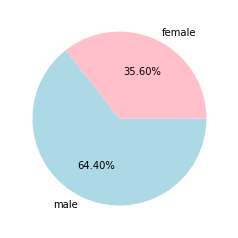

In [62]:
plt.pie([m,f],colors=['lightblue', 'pink'], labels=['male', 'female'],counterclock=False, autopct='%2.2f%%')
plt.show()

# 2. Create a scatterplot with the Fare paid and the Age, differ the plot color by gender

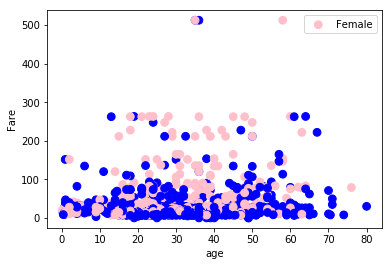

In [63]:
ag = titanic['age']
fare = titanic['fare']
titanic['col'] = np.where(titanic['sex']=='female','pink','blue')
plt.scatter(ag,fare,c=titanic['col'],label=['Male','Female'], s=60)
plt.xlabel('age')
plt.ylabel('Fare')
plt.legend(['Female','Male'])

# 2.5. Problem Statement: Data Cleaning

It happens all the time: someone gives you data containing malformed strings, Python, lists
and missing data. How do you tidy it up so you can get on with the analysis?

Take this monstrosity as the DataFrame to use in the following puzzles:

In [64]:
dataf = pd.DataFrame({'From_To': ['LoNDon_paris', 'MAdrid_miLAN', 'londON_StockhOlm',
'Budapest_PaRis', 'Brussels_londOn'],
'FlightNumber': [10045, np.nan, 10065, np.nan, 10085],
'RecentDelays': [[23, 47], [], [24, 43, 87], [13], [67, 32]],
'Airline': ['KLM(!)', '<Air France> (12)', '(British Airways. )',
'12. Air France', '"Swiss Air"']})

In [65]:
dataf

,From_To,FlightNumber,RecentDelays,Airline
0,LoNDon_paris,10045.0,"[23, 47]",KLM(!)
1,MAdrid_miLAN,NaN,[],<Air France> (12)
2,londON_StockhOlm,10065.0,"[24, 43, 87]",(British Airways. )
3,Budapest_PaRis,NaN,[13],12. Air France
4,Brussels_londOn,10085.0,"[67, 32]","""Swiss Air"""


# 1. Some values in the the FlightNumber column are missing. These numbers are meant to increase by 10 with each row so 10055 and 10075 need to be put in place. Fill in these missing numbers and make the column an integer column (instead of a float column).

In [66]:
start = 10045
fn_len = len(dataf['FlightNumber'])
dataf['FlightNumber'] = [start + (i*10) for i in range(fn_len) ]
dataf

,From_To,FlightNumber,RecentDelays,Airline
0,LoNDon_paris,10045,"[23, 47]",KLM(!)
1,MAdrid_miLAN,10055,[],<Air France> (12)
2,londON_StockhOlm,10065,"[24, 43, 87]",(British Airways. )
3,Budapest_PaRis,10075,[13],12. Air France
4,Brussels_londOn,10085,"[67, 32]","""Swiss Air"""


# 2. The From_To column would be better as two separate columns! Split each string on theun derscore delimiter _ to give a new temporary DataFrame with the correct values. Assign the correct column names to this temporary DataFrame.

In [69]:
temp_dataf = pd.DataFrame()
temp_dataf[['From', 'To']] = dataf['From_To'].str.split('_', expand=True)
temp_dataf

,From,To
0,LoNDon,paris
1,MAdrid,miLAN
2,londON,StockhOlm
3,Budapest,PaRis
4,Brussels,londOn


# 3. Notice how the capitalisation of the city names is all mixed up in this temporary DataFrame. Standardise the strings so that only the first letter is uppercase (e.g. "londON" should become"London".)

In [70]:
temp_dataf['From'] = temp_dataf['From'].str.capitalize()
temp_dataf['To'] = temp_dataf['To'].str.capitalize()
temp_dataf

,From,To
0,London,Paris
1,Madrid,Milan
2,London,Stockholm
3,Budapest,Paris
4,Brussels,London


# 4. Delete the From_To column from df and attach the temporary DataFrame from the previous questions.

In [71]:
dataf.drop('From_To',axis=1,inplace=True)
dataf=pd.concat([dataf,temp_dataf],axis=1)
dataf

,FlightNumber,RecentDelays,Airline,From,To
0,10045,"[23, 47]",KLM(!),London,Paris
1,10055,[],<Air France> (12),Madrid,Milan
2,10065,"[24, 43, 87]",(British Airways. ),London,Stockholm
3,10075,[13],12. Air France,Budapest,Paris
4,10085,"[67, 32]","""Swiss Air""",Brussels,London


# 5. In the RecentDelays column, the values have been entered into the DataFrame as a list. We would like each first value in its own column, each second value in its own column, and so on. If there isn't an Nth value, the value should be NaN.

# Expand the Series of lists into a DataFrame named delays, rename the columns delay_1, delay_2, etc. and replace the unwanted RecentDelays column in df with delays.

In [76]:
delay = max(dataf['RecentDelays'].values.tolist(),key=len)
Header=[]
for idx,val in enumerate(delay):
    Header.append('delay_' + str(idx))
    
newdelay = dataf['RecentDelays'].apply(lambda x: ', '.join(map(str, x))).str.split(',',expand=True)
newdelay.columns = Header

dataf.drop(columns = 'RecentDelays', inplace=True)
dataf = pd.concat([dataf,newdelay],axis=1)
dataf

,FlightNumber,Airline,From,To,delay_0,delay_1,delay_2
0,10045,KLM(!),London,Paris,23,47,None
1,10055,<Air France> (12),Madrid,Milan,,None,None
2,10065,(British Airways. ),London,Stockholm,24,43,87
3,10075,12. Air France,Budapest,Paris,13,None,None
4,10085,"""Swiss Air""",Brussels,London,67,32,None


# 2.6. Problem Statement: Pandas SQL

# Problem statement 1:
Read the following data set:

https://archive.ics.uci.edu/ml/machine-learning-databases/adult/

Rename the columns as per the description from this file:

https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.names

In [77]:
import sqlite3 as sql
db=pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data')

In [78]:
db.columns =['age','workclass', 'fnlwgt', 'education', 'education-num', 'marital-status', 'occupation', 'relationship', 'race', 'sex', 'capital-gain', 'capital-loss', 'hours-per-week', 'native-country','label' ]
df.head()

,Id,Name,Year,Gender,State,Count
0,11350,Emma,2004,F,AK,62
1,11351,Madison,2004,F,AK,48
2,11352,Hannah,2004,F,AK,46
3,11353,Grace,2004,F,AK,44
4,11354,Emily,2004,F,AK,41


# Task: Create a sql db from adult dataset and name it sqladb

In [79]:
from pandas import DataFrame, Series

from pandasql import sqldf
pysqldf = lambda q: sqldf(q, globals())
sqladb = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data')

In [82]:
sqladb.columns =['age','workclass', 'fnlwgt', 'education', 'educationnum', 'maritalstatus', 'occupation', 
             'relationship', 'race', 'sex', 'capitalgain', 'capitalloss', 'hoursperweek', 'nativecountry','label' ]
sqladb.head()

,age,workclass,fnlwgt,education,educationnum,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,nativecountry,label
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K


# 1. Select 10 records from the adult sqladb

In [84]:
tenrec = 'SELECT * FROM sqladb LIMIT 10;'
pysqldf(tenrec)

,age,workclass,fnlwgt,education,educationnum,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,nativecountry,label
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
5,49,Private,160187,9th,5,Married-spouse-absent,Other-service,Not-in-family,Black,Female,0,0,16,Jamaica,<=50K
6,52,Self-emp-not-inc,209642,HS-grad,9,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,45,United-States,>50K
7,31,Private,45781,Masters,14,Never-married,Prof-specialty,Not-in-family,White,Female,14084,0,50,United-States,>50K
8,42,Private,159449,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,5178,0,40,United-States,>50K
9,37,Private,280464,Some-college,10,Married-civ-spouse,Exec-managerial,Husband,Black,Male,0,0,80,United-States,>50K


# 2. Show me the average hours per week of all men who are working in private sector

In [85]:
pysqldf("""select avg(hoursperweek) 'Average Hours Per Week' from sqladb where trim(workclass)='Private' ;""")

,Average Hours Per Week
0,40.267096


# 3. Show me the frequency table for education, occupation and relationship, separately

In [86]:
q = 'select education, count(1) as Frequency from sqladb group by education'
pysqldf(q)

,education,Frequency
0,10th,933
1,11th,1175
2,12th,433
3,1st-4th,168
4,5th-6th,333
5,7th-8th,646
6,9th,514
7,Assoc-acdm,1067
8,Assoc-voc,1382
9,Bachelors,5354


In [87]:
q = 'select occupation, count(1) as Frequency from sqladb group by occupation'
pysqldf(q)

,occupation,Frequency
0,?,1843
1,Adm-clerical,3769
2,Armed-Forces,9
3,Craft-repair,4099
4,Exec-managerial,4066
5,Farming-fishing,994
6,Handlers-cleaners,1370
7,Machine-op-inspct,2002
8,Other-service,3295
9,Priv-house-serv,149


In [88]:
q = 'select relationship, count(1) as Frequency from sqladb group by relationship'
pysqldf(q)

,relationship,Frequency
0,Husband,13193
1,Not-in-family,8304
2,Other-relative,981
3,Own-child,5068
4,Unmarried,3446
5,Wife,1568


# 4. Are there any people who are married, working in private sector and having a master’s degree

In [89]:
query='''select * from sqladb where trim(maritalstatus) ='Married-civ-spouse' and trim(workclass)='Private' and trim(education)='Masters' '''
pysqldf(query)

,age,workclass,fnlwgt,education,educationnum,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,nativecountry,label
0,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
1,33,Private,202051,Masters,14,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,50,United-States,<=50K
2,76,Private,124191,Masters,14,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,40,United-States,>50K
3,31,Private,99928,Masters,14,Married-civ-spouse,Prof-specialty,Wife,White,Female,0,0,50,United-States,<=50K
4,35,Private,138992,Masters,14,Married-civ-spouse,Prof-specialty,Other-relative,White,Male,7298,0,40,United-States,>50K
5,34,Private,142897,Masters,14,Married-civ-spouse,Exec-managerial,Husband,Asian-Pac-Islander,Male,7298,0,35,Taiwan,>50K
6,62,Private,270092,Masters,14,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,40,United-States,>50K
7,41,Private,445382,Masters,14,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,1977,65,United-States,>50K
8,33,Private,208405,Masters,14,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,50,United-States,>50K
9,49,Private,192776,Masters,14,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,1977,45,United-States,>50K


# 5. What is the average, minimum and maximum age group for people working in different sectors

In [90]:
query='select workclass,avg(age),min(age),max(age) from sqladb group by workclass'
pysqldf(query)

,workclass,avg(age),min(age),max(age)
0,?,40.960240,17,90
1,Federal-gov,42.590625,17,90
2,Local-gov,41.751075,17,90
3,Never-worked,20.571429,17,30
4,Private,36.797585,17,90
5,Self-emp-inc,46.017025,17,84
6,Self-emp-not-inc,44.969697,17,90
7,State-gov,39.436392,17,81
8,Without-pay,47.785714,19,72


# 6. Calculate age distribution by country

In [91]:
query='''select nativecountry as 'Native Country',avg(age),min(age),max(age) from sqladb group by nativecountry'''
pysqldf(query)

,Native Country,avg(age),min(age),max(age)
0,?,38.725557,17,90
1,Cambodia,37.789474,18,65
2,Canada,42.545455,17,80
3,China,42.533333,22,75
4,Columbia,39.711864,18,75
5,Cuba,45.768421,21,82
6,Dominican-Republic,37.728571,18,78
7,Ecuador,36.642857,21,90
8,El-Salvador,34.132075,17,79
9,England,41.155556,17,90


# 7. Compute a new column as 'Net-Capital-Gain' from the two columns 'capitalgain' and 'capitalloss'

In [97]:
query='''select capitalgain - capitalloss as 'Net-Capital-Gain' ,capitalgain,capitalloss from sqladb'''
pysqldf(query)

,Net-Capital-Gain,capitalgain,capitalloss
0,0,0,0
1,0,0,0
2,0,0,0
3,0,0,0
4,0,0,0
5,0,0,0
6,0,0,0
7,14084,14084,0
8,5178,5178,0
9,0,0,0


# Problem statement 2:

Read the following data set:

https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data

In [12]:
import sqlalchemy
from sqlalchemy import create_engine

adb = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data',sep=",",header=None)
adb.columns=['age','workclass','fnlwgt','education','educationNum','marital-status','occupation','relationship','race','sex','capital-gain','capital-loss','hours-per-week','native-country','income']
adb.head()

,age,workclass,fnlwgt,education,educationNum,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


# Task:

# 1. Create an sqlalchemy engine using a sample from the data set

In [15]:
engine = create_engine('sqlite:///myData.db')
adb.to_sql('alchemynew', engine)

# 2. Write two basic update queries

In [16]:
#update query
print(engine.execute('''UPDATE alchemynew
SET income = '<30K'
WHERE age=39 and workclass=' State-gov' and fnlwgt=77516
and education=' Bachelors' and educationNum=13'''))

#after updating the record
print(engine.execute('''SELECT * FROM alchemynew
WHERE age=39 and workclass=' State-gov' and fnlwgt=77516
and education=' Bachelors' and educationNum=13 ''').fetchall())

#update query2
print(engine.execute('''UPDATE alchemynew
SET income = '<30K'
WHERE age=38 and workclass=' Private' and fnlwgt=215646
and education=' HS-grad' and educationNum=9'''))

#record after updating
print(engine.execute('''SELECT * FROM alchemynew
WHERE age=38 and workclass=' Private' and fnlwgt=215646
and education=' HS-grad' and educationNum=9''').fetchall())


[(0, 39, ' State-gov', 77516, ' Bachelors', 13, ' Never-married', ' Adm-clerical', ' Not-in-family', ' White', ' Male', 2174, 0, 40, ' United-States', '<30K')]
[(2, 38, ' Private', 215646, ' HS-grad', 9, ' Divorced', ' Handlers-cleaners', ' Not-in-family', ' White', ' Male', 0, 0, 40, ' United-States', '<30K')]


# 3. Write two delete queries

In [17]:
#deleting the record
print(engine.execute('''DELETE FROM alchemynew
WHERE age=39 and workclass=' State-gov' and fnlwgt=77516
and education=' Bachelors' and educationNum=13'''))

#after deleting record is empty
print(engine.execute('''SELECT * FROM alchemynew
WHERE age=39 and workclass=' State-gov' and fnlwgt=77516
and education=' Bachelors' and educationNum=13 ''').fetchall())

#deleting the record
print(engine.execute('''DELETE FROM alchemynew
WHERE age=38 and workclass=' Private' and fnlwgt=215646
and education=' HS-grad' and educationNum=9'''))

print(engine.execute('''SELECT * FROM alchemynew
WHERE age=38 and workclass=' Private' and fnlwgt=215646
and education=' HS-grad' and educationNum=9''').fetchall())

[]
[]


# 4. Write two filter queries

In [95]:
#filer query using LIKE
print(engine.execute('''SELECT * FROM alchemynew WHERE occupation LIKE ' A%' ''').fetchall())

[(12, 23, ' Private', 122272, ' Bachelors', 13, ' Never-married', ' Adm-clerical', ' Own-child', ' White', ' Female', 0, 0, 30, ' United-States', ' <=50K'), (33, 30, ' Federal-gov', 59951, ' Some-college', 10, ' Married-civ-spouse', ' Adm-clerical', ' Own-child', ' White', ' Male', 0, 0, 40, ' United-States', ' <=50K'), (37, 19, ' Private', 544091, ' HS-grad', 9, ' Married-AF-spouse', ' Adm-clerical', ' Wife', ' White', ' Female', 0, 0, 25, ' United-States', ' <=50K'), (43, 49, ' Private', 94638, ' HS-grad', 9, ' Separated', ' Adm-clerical', ' Unmarried', ' White', ' Female', 0, 0, 40, ' United-States', ' <=50K'), (58, 41, ' Private', 147372, ' HS-grad', 9, ' Married-civ-spouse', ' Adm-clerical', ' Husband', ' White', ' Male', 0, 0, 48, ' United-States', ' <=50K'), (66, 28, ' Private', 183175, ' Some-college', 10, ' Divorced', ' Adm-clerical', ' Not-in-family', ' White', ' Female', 0, 0, 40, ' United-States', ' <=50K'), (67, 53, ' Private', 169846, ' HS-grad', 9, ' Married-civ-spouse',

In [36]:
#fliter query using IN
print(engine.execute('''SELECT * FROM alchemynew WHERE age  IN(30, 40) ''').fetchall())

[(11, 30, ' State-gov', 141297, ' Bachelors', 13, ' Married-civ-spouse', ' Prof-specialty', ' Husband', ' Asian-Pac-Islander', ' Male', 0, 0, 40, ' India', ' >50K'), (14, 40, ' Private', 121772, ' Assoc-voc', 11, ' Married-civ-spouse', ' Craft-repair', ' Husband', ' Asian-Pac-Islander', ' Male', 0, 0, 40, ' ?', ' >50K'), (20, 40, ' Private', 193524, ' Doctorate', 16, ' Married-civ-spouse', ' Prof-specialty', ' Husband', ' White', ' Male', 0, 0, 60, ' United-States', ' >50K'), (33, 30, ' Federal-gov', 59951, ' Some-college', 10, ' Married-civ-spouse', ' Adm-clerical', ' Own-child', ' White', ' Male', 0, 0, 40, ' United-States', ' <=50K'), (59, 30, ' Private', 188146, ' HS-grad', 9, ' Married-civ-spouse', ' Machine-op-inspct', ' Husband', ' White', ' Male', 5013, 0, 40, ' United-States', ' <=50K'), (60, 30, ' Private', 59496, ' Bachelors', 13, ' Married-civ-spouse', ' Sales', ' Husband', ' White', ' Male', 2407, 0, 40, ' United-States', ' <=50K'), (76, 40, ' Private', 32214, ' Assoc-acdm

# 5. Write two function queries

In [100]:
#using LENGTH function
print(engine.execute('''SELECT * FROM alchemynew WHERE LENGTH(workclass) < 7 ''').fetchall())

[(27, 54, ' ?', 180211, ' Some-college', 10, ' Married-civ-spouse', ' ?', ' Husband', ' Asian-Pac-Islander', ' Male', 0, 0, 60, ' South', ' >50K'), (61, 32, ' ?', 293936, ' 7th-8th', 4, ' Married-spouse-absent', ' ?', ' Not-in-family', ' White', ' Male', 0, 0, 40, ' ?', ' <=50K'), (69, 25, ' ?', 200681, ' Some-college', 10, ' Never-married', ' ?', ' Own-child', ' White', ' Male', 0, 0, 40, ' United-States', ' <=50K'), (77, 67, ' ?', 212759, ' 10th', 6, ' Married-civ-spouse', ' ?', ' Husband', ' White', ' Male', 0, 0, 2, ' United-States', ' <=50K'), (106, 17, ' ?', 304873, ' 10th', 6, ' Never-married', ' ?', ' Own-child', ' White', ' Female', 34095, 0, 32, ' United-States', ' <=50K'), (128, 35, ' ?', 129305, ' HS-grad', 9, ' Married-civ-spouse', ' ?', ' Husband', ' White', ' Male', 0, 0, 40, ' United-States', ' <=50K'), (149, 43, ' ?', 174662, ' Some-college', 10, ' Divorced', ' ?', ' Not-in-family', ' White', ' Female', 0, 0, 40, ' United-States', ' <=50K'), (154, 52, ' ?', 252903, ' H

In [102]:
#using Upper function
print(engine.execute('''SELECT sex,upper(sex) FROM alchemynew WHERE LENGTH(workclass) < 9 and age > 30 ''').fetchall())

[(' Male', ' MALE'), (' Female', ' FEMALE'), (' Female', ' FEMALE'), (' Female', ' FEMALE'), (' Male', ' MALE'), (' Male', ' MALE'), (' Male', ' MALE'), (' Male', ' MALE'), (' Male', ' MALE'), (' Male', ' MALE'), (' Male', ' MALE'), (' Male', ' MALE'), (' Female', ' FEMALE'), (' Male', ' MALE'), (' Female', ' FEMALE'), (' Male', ' MALE'), (' Male', ' MALE'), (' Male', ' MALE'), (' Male', ' MALE'), (' Male', ' MALE'), (' Male', ' MALE'), (' Male', ' MALE'), (' Female', ' FEMALE'), (' Male', ' MALE'), (' Female', ' FEMALE'), (' Female', ' FEMALE'), (' Male', ' MALE'), (' Male', ' MALE'), (' Male', ' MALE'), (' Male', ' MALE'), (' Male', ' MALE'), (' Male', ' MALE'), (' Male', ' MALE'), (' Male', ' MALE'), (' Female', ' FEMALE'), (' Female', ' FEMALE'), (' Male', ' MALE'), (' Male', ' MALE'), (' Male', ' MALE'), (' Male', ' MALE'), (' Female', ' FEMALE'), (' Male', ' MALE'), (' Female', ' FEMALE'), (' Female', ' FEMALE'), (' Male', ' MALE'), (' Male', ' MALE'), (' Female', ' FEMALE'), (' 

# END OF ASSIGMENT